# Sentiment Classification on Product Reviews

- Family Name: Vanikul
- Given Name: Rajath Akshay


Programming Language: R 3.5.1 in Jupyter Notebook

Python Libraries used:
- Text BLob
- NLTK
- Cuff Links
- Plotly
- WordCloud
- Matplot 
- Pandas

## Table of Contents

* [Introduction](#sec_1)
* [Pre-processing and feature generation](#sec_2)
* [Model](#sec_3)
* [Conclusion](#sec_4)

## 1. Introduction <a class="anchor" id="sec_1"></a>

Sentiment classification is typical text classification scenario where sentences are classified based on opinions they hold. The task is to build a model that learns form classified product reviews and predict the sentiment of the review. 
The following case provides an example of text classification carried out throughout the assignment


### 1.1 Import Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import nltk
import re
from nltk.tokenize import RegexpTokenizer
from os import path
from nltk.tokenize import word_tokenize
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
from nltk.stem.snowball import SnowballStemmer
from spellchecker import SpellChecker
from textblob import TextBlob, Word, Blobber
import plotly.tools as tls
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.plotly as py
from textblob import Word
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn import metrics
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import MultinomialNB
#!pip install textblob
#nltk.download('wordnet')
#nltk.download('all')
#pip install wordcloud
#tls.embed('https://plot.ly/~cufflinks/8')
#!pip install cufflinks --upgrade
#nltk.download('vader_lexicon')

### 1.2 Import Libraries

In [2]:
# load the datasets to a variable
train =  pd.read_csv("train_data.csv")
train_label =  pd.read_csv("train_label.csv")
test=pd.read_csv("test_data.csv")

## 2. Pre-processing and feature generation<a class="anchor" id="sec_2"></a>

### 2.1 Exploratory data analysis

In [3]:
train = train.merge(train_label) # merge the train data with the target variable

In [4]:
train = train.sample(65000) # sample the training set for convenience 

In [5]:
#plotting the Review Rating distribution of the sample data using barplot.
train['label'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    legend=dict(),
    yTitle='count',
    title='Review Rating Distribution')

In [6]:
#Calculating Sentiment Polarity , Review Length and Word Count of each review.
train['Sentiment Polarity'] = train['text'].map(lambda text: TextBlob(text).sentiment.polarity)
train['Review Length'] = train['text'].astype(str).apply(len)
train['Word Count'] = train['text'].apply(lambda x: len(str(x).split()))

In [7]:
#Plotting the review length of each document using iplot.
train['Review Length'].iplot(
    kind='hist',
    bins=100,
    xTitle='review length',
    linecolor='black',
    legend=dict(),
    yTitle='count',
    title='Review Text Length Distribution')

In [8]:
#Plotting the Sentiment Polarity of each document using iplot.
train['Sentiment Polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='Polarity',
    linecolor='black',
    legend=dict(),
    yTitle='Count',
    title='Sentiment Polarity Distribution before Text Processing')

In [9]:
#Plotting the Word count of each document using iplot.
train['Word Count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    legend=dict(),
    yTitle='count',
    title='Review Text Word Count Distribution')

### 2.2 Pre-processing

In [10]:
train["clean_text"] = None # create a new column to store clean text

In [11]:
#convert the text to lower case. 
train['clean_text'] = train['text'].apply(lambda x: " ".join(x.lower() for x in x.split(" ")))

In [12]:
# defining all the concordance in a dictionary.

Con_appos = {
"aren't" : "are not",
"can't" : "cannot",
"couldn't" : "could not",
"didn't" : "did not",
"doesn't" : "does not",
"don't" : "do not",
"hadn't" : "had not",
"hasn't" : "has not",
"haven't" : "have not",
"he'd" : "he would",
"he'll" : "he will",
"he's" : "he is",
"i'd" : "I would",
"i'd" : "I had",
"i'll" : "I will",
"i'm" : "I am",
"isn't" : "is not",
"it's" : "it is",
"it'll":"it will",
"i've" : "I have",
"let's" : "let us",
"mightn't" : "might not",
"mustn't" : "must not",
"shan't" : "shall not",
"she'd" : "she would",
"she'll" : "she will",
"she's" : "she is",
"shouldn't" : "should not",
"that's" : "that is",
"there's" : "there is",
"they'd" : "they would",
"they'll" : "they will",
"they're" : "they are",
"they've" : "they have",
"we'd" : "we would",
"we're" : "we are",
"weren't" : "were not",
"we've" : "we have",
"what'll" : "what will",
"what're" : "what are",
"what's" : "what is",
"what've" : "what have",
"where's" : "where is",
"who'd" : "who would",
"who'll" : "who will",
"who're" : "who are",
"who's" : "who is",
"who've" : "who have",
"won't" : "will not",
"wouldn't" : "would not",
"you'd" : "you would",
"you'll" : "you will",
"you're" : "you are",
"you've" : "you have",
"'re": " are",
"wasn't": "was not",
"we'll":" will",
"didn't": "did not"
}

In [13]:
# replace the actual words on thr words with apostrophes
train['clean_text'] = train['clean_text'].apply(lambda x:" ".join(Con_appos[x] if x in Con_appos else x for x in x.split(" ") ))

In [14]:
# use of wordnet lemmatization.
train['clean_text'] = train['clean_text'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))
train['clean_text'].head()

647051    i went to take my old trek bike for rehab to s...
495215    barista pretend like they do not hear customer...
435753    wow what a great manager ( monika ) food wa fa...
526177    my pup absolutely love wagging tails. he is al...
177418    do not go. flat out, too expensive for the foo...
Name: clean_text, dtype: object

In [15]:
#Frequency of top 25 most frequent words.
freq = pd.DataFrame(pd.Series(' '.join(train['clean_text']).split()).value_counts()[:25])

In [16]:
#Resetting the index of frequency
freq=freq.reset_index()

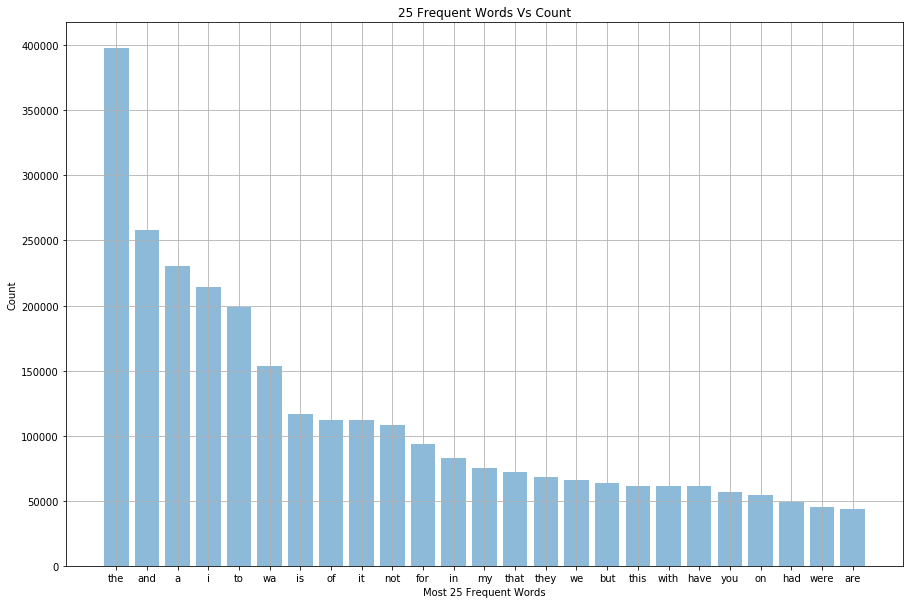

In [17]:
#Plotting the top 25 most frequent words using Matplot
plt.figure(figsize=(15,10))
plt.grid(True)
plt.bar(freq['index'], freq[0], align='center', alpha=0.5)
plt.ylabel('Count')
plt.xlabel('Most 25 Frequent Words')
plt.title('25 Frequent Words Vs Count')
plt.rcParams.update({'font.size': 11})
plt.show()

In [18]:
#Freq of all the words
freq = pd.DataFrame(pd.Series(' '.join(train['clean_text']).split()).value_counts())

In [19]:
# resetting the index
freq=freq.reset_index()

In [20]:
# Group by the least frequent words 25
count=pd.DataFrame(freq.groupby([0]).count()[:25]).reset_index()

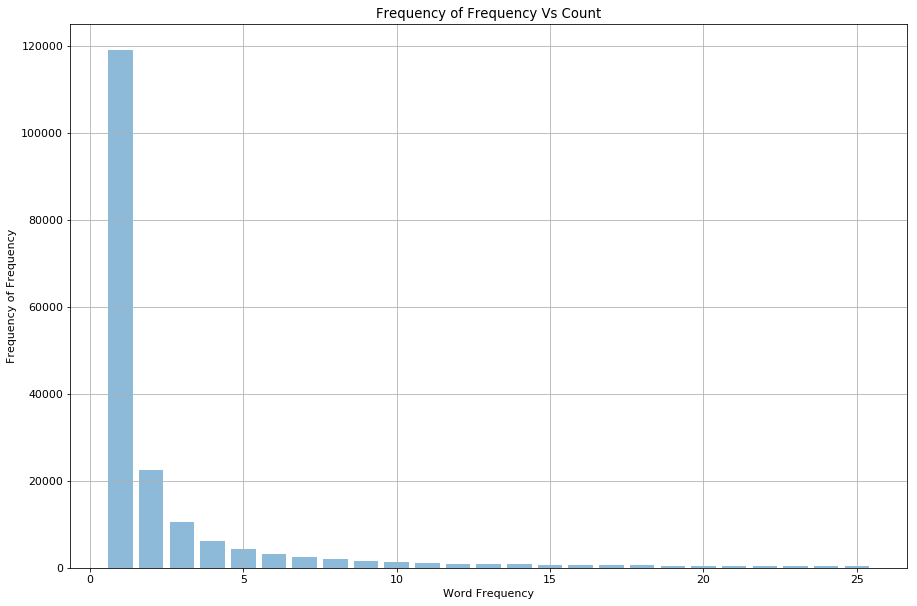

In [21]:
#plotting frequency of frequency for least words using matplot lib.
plt.figure(figsize=(15,10))
plt.grid(True)
plt.bar(count[0], count['index'], align='center', alpha=0.5)
plt.ylabel('Frequency of Frequency')
plt.xlabel('Word Frequency')
plt.title('Frequency of Frequency Vs Count')
plt.rcParams.update({'font.size': 11})
plt.show()

### 2.3 Word Cloud for Positive and Negative Words

In [22]:
#Using Nltk Sentiment Intensity Analyser to calculate Sentiment polarity of each document
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer



sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neg_word_list=[]
#Calculating the sentiment polarity of each document and then appending into positive and negative word with the threshold value.
for word in  train['clean_text']:
    if (sid.polarity_scores(word)['compound']) >= 0.8:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.95:
        neg_word_list.append(word)               



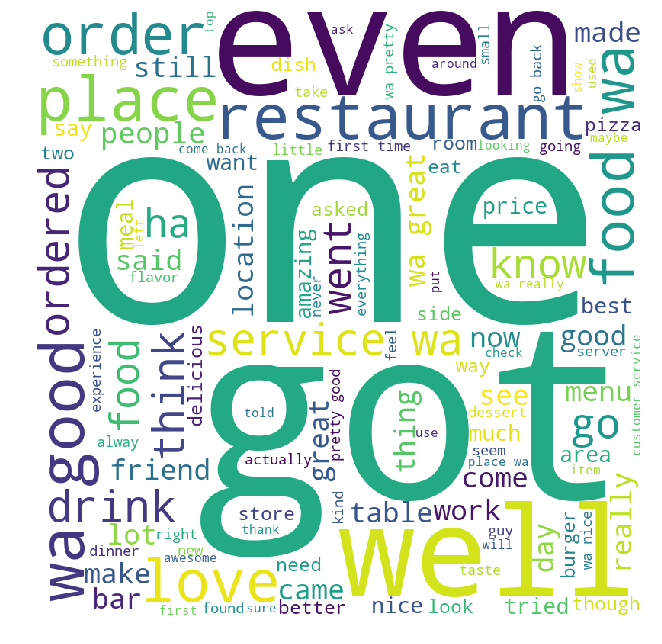

In [23]:
#Generating Word Cloud using postitve words list.
comment_words = ' '
for words in pos_word_list: 
    comment_words = comment_words + words + ' '
  
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                max_words=300,
                min_font_size = 15).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (9,12), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

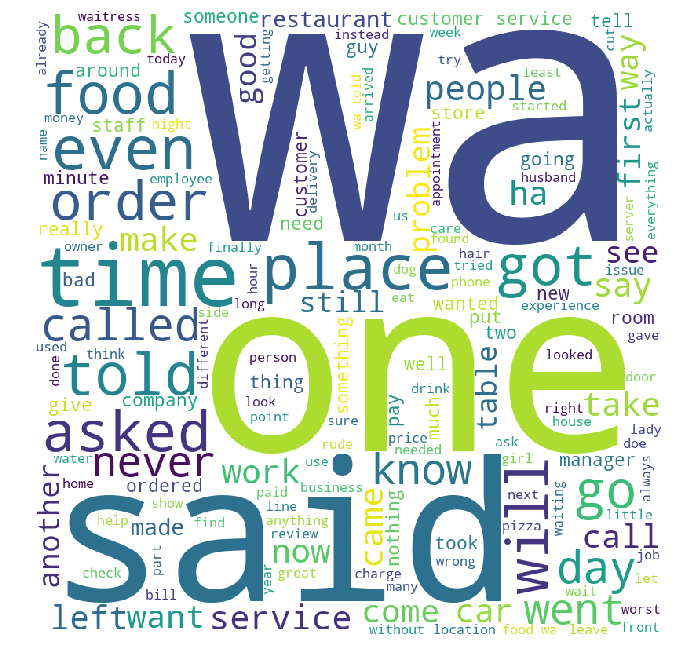

In [24]:
#Generating Word Cloud using negative words list.
comment_words = ' '
for words in neg_word_list: 
    comment_words = comment_words + words + ' '
  
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                max_words=300,
                min_font_size = 15).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (12,9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [25]:
#Calculating Sentiment polarity after Text cleaning.
train['Sentiment Polarity 2'] = train['clean_text'].map(lambda text: TextBlob(text).sentiment.polarity)

In [26]:
train['Sentiment Polarity 2'].iplot(
    kind='hist',
    bins=50,
    xTitle='Polarity',
    linecolor='black',
    legend=dict(),
    yTitle='Count',
    title='Sentiment Polarity Distribution After Text Processing')

### 2.4 Feature generation

In [ ]:
# Convert the text into Tfidf vector form with max features as 7000 and appending bigrams and trigrams.
vectorizer = TfidfVectorizer(max_features=7000,sublinear_tf=True,norm='l2',ngram_range=(1,3),analyzer="word")
X = vectorizer.fit_transform(train["clean_text"])

In [ ]:
# convert the vector object to dataframe and append the column names with features.
columns = vectorizer.get_feature_names()
df = pd.DataFrame(X.toarray())
df.columns = columns
print(df.shape)

## 3. Models<a class="anchor" id="sec_3"></a>

In [ ]:
# split the dataset to train and test with test size 20%. 
X_train, X_test, y_train, y_test = train_test_split(df, train["label"], test_size = 0.2) 

### 3.1 Multinomial Logistic regression.

In [ ]:
# Multinomial Logistic regression model
mul_lr = linear_model.LogisticRegression(multi_class='multinomial', solver='newton-cg',C=0.6, 
                                         class_weight="balanced", fit_intercept=False,
                                         max_iter=250, penalty='l2',tol=0.0001).fit(X_train,y_train)

In [ ]:
# cross validation score
scores = cross_val_score(mul_lr, X_train, y_train, cv=3)
scores

In [ ]:
#test the model to predict the test set.
pred = mul_lr.predict(X_test)

# determine the accuracy
metrics.accuracy_score(y_test,pred)

## 4. Conclusion <a class="anchor" id="sec_6"></a>

We have successufully modeled the text classifier to predict the sentiment of a review. We have performed the following steps:

* Text pre-processing to regularise words for analysis
* Performed feature generation to extract potential features for the model.
* Multinomial Logistic regression
    - Convenient probability scores for observations
    - Efficient implementations available across tools
    - Multi-collinearity is not really an issue
    - can be countered with L2 regularization to an extent
    - Wide spread industry comfort for logistic regression solutions

We have arrived at an accuracy of 62.5% on the test data when the model was trained on 20% of the train data. We failed to train the model on the complete train data due to lack of computational resource. We could expect a higher accuracy when the logistic model is trained on the complete data set.